<a href="https://colab.research.google.com/github/Ahmed-Elshoubashy/Image-Mosaics/blob/main/Image_Mosaics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.activity.readonly&response_type=code

Enter your authorization code:
4/1AY0e-g5gjCd9sjzQGg1u7CzSTypR_8nBP2NHHWNinmf9JM-rIdY_8OYSBHs


**Required importes**

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
import pandas as pd
import csv
import matplotlib.image as mpimg

**Reading the images and showing them**

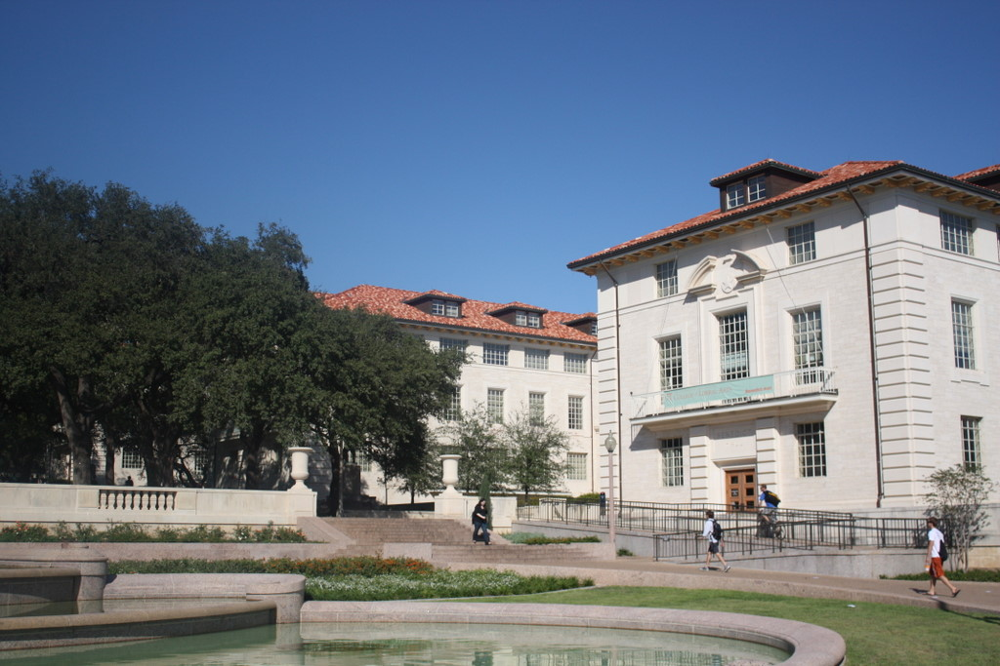

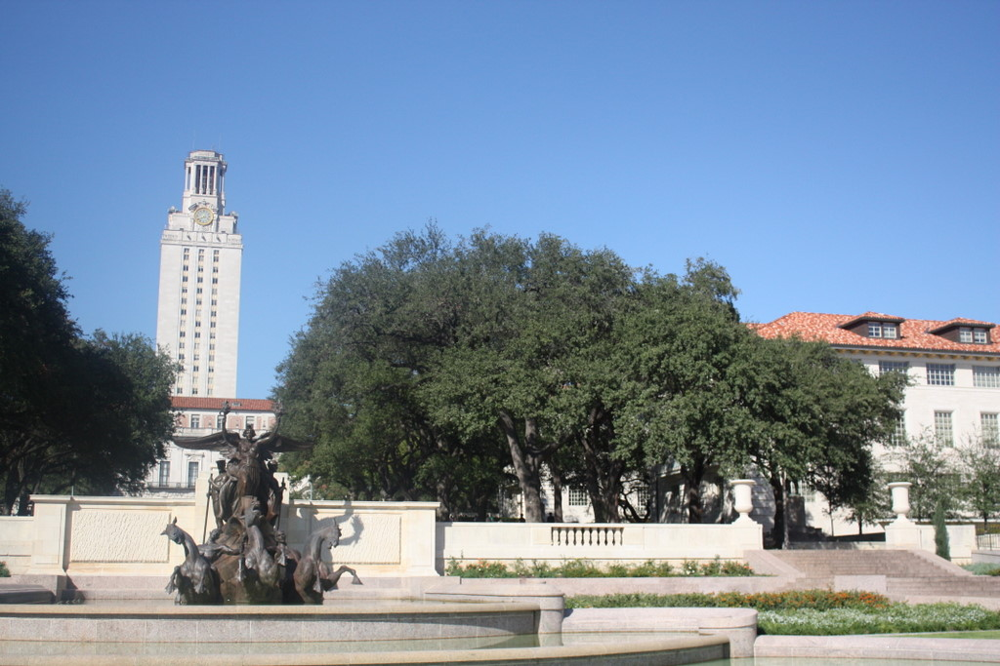

In [ ]:
img1 = cv2.imread('drive/MyDrive/CV_datasets/image1.jpg') # read image
img2 = cv2.imread('drive/MyDrive/CV_datasets/image2.jpg')
cv2_imshow(img1)
cv2_imshow(img2)

**Getting Correspondences points**

In [ ]:
p = np.array([(370, 443, 495, 499, 318, 319, 441, 311, 74, 529, 351)
              ,(291, 307, 351, 399, 459, 503, 557, 615, 496, 509, 522)]).T
pdash = np.array([(812, 889, 949, 957, 771, 775, 906, 775, 538, 997, 808)
                  ,(321, 330, 372, 422, 492, 536, 595, 651, 535, 539, 555)]).T


A = 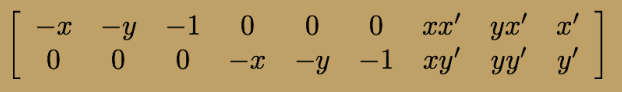

**Function to get the H matrix using the A matrix**

In [ ]:
def calcHMatrix(origPoints,transFormedPoints):
  A = np.zeros((2*len(p),9))
  k = 0
  for i in range(len(p)):
      A[k] = [-origPoints[i][0],-origPoints[i][1],-1,0,0,0,origPoints[i][0]*transFormedPoints[i][0],origPoints[i][1]*transFormedPoints[i][0],transFormedPoints[i][0]]
      A[k+1] = [0,0,0,-origPoints[i][0],-origPoints[i][1],-1,origPoints[i][0]*transFormedPoints[i][1],origPoints[i][1]*transFormedPoints[i][1],transFormedPoints[i][1]]
      k = k + 2
  U,segma,VT = np.linalg.svd(A)
  H = np.reshape(VT[-1:],(3,3))
  H = H/H[2][2]
  return H

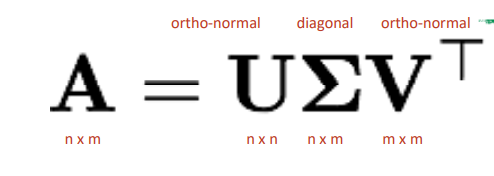

In [ ]:
H = calcHMatrix(p,pdash)
print(H)

[[ 7.57537905e-01  8.84107608e-03  4.52847079e+02]
 [-1.27281096e-01  8.89966356e-01  7.73859542e+01]
 [-2.03941318e-04 -6.47243966e-05  1.00000000e+00]]


**We compare the collected points and the points we obtained using this H**

In [ ]:
p_varification= np.hstack((p,np.ones((len(p),1))))
for i in range(len(p)):
  xdash , ydash , one  = np.dot(H,p_varification[i])
  print([xdash/one//1 , ydash/one//1],'------>',pdash[i])

[812.0, 319.0] ------> [812 321]
[889.0, 330.0] ------> [889 330]
[948.0, 372.0] ------> [949 372]
[956.0, 422.0] ------> [957 422]
[770.0, 491.0] ------> [771 492]
[774.0, 536.0] ------> [775 536]
[905.0, 591.0] ------> [906 595]
[773.0, 652.0] ------> [775 651]
[538.0, 534.0] ------> [538 535]
[998.0, 538.0] ------> [997 539]
[808.0, 555.0] ------> [808 555]


In [ ]:
def getValues(img,H):
  coords = dict()
  minX = 0x7fffffff
  minY = 0x7fffffff
  maxX = -1 * 0x7fffffff
  maxY = -1 * 0x7fffffff
  for row in range(img.shape[0]):
    for col in range(img.shape[1]):
      homgCoords = np.array([(col, row, 1)]).T
      transformedCoords = H.dot(homgCoords)
      transformedCoords = transformedCoords/transformedCoords[2];
      newX, newY = int(transformedCoords[0]),int(transformedCoords[1])
      coords[row,col]=np.array([(newX, newY)])
      minX = min(minX, newX)
      minY = min(minY, newY)
      maxX = max(maxX, newX)
      maxY = max(maxY, newY)
  return minX, minY, maxX,maxY, coords

**Warping image function**

In [ ]:
def warpingImage(img, H, nChannels=3):
  minX, minY, maxX, maxY, coords = getValues(img,H)
  shiftX = minX * -1
  shiftY = minY * -1
  warpedImage = np.zeros(((maxX - minX) + 2, (maxX - minX) + 2, nChannels, 2))
  returnImage = np.zeros(((maxY - minY) + 2, (maxX - minX) + 2, nChannels))
  for row in range(img.shape[0]):
    for col in range(img.shape[1]):
      newX, newY = coords[row,col][0][0], coords[row,col][0][1]
      newX += shiftX
      newY += shiftY
      subpixels = np.array([(newX,newY),(newX+1,newY),(newX,newY+1),(newX+1,newY+1)])
      for subpixel in subpixels:
            for channel in range(nChannels):
              warpedImage[subpixel[1]][subpixel[0]][channel][0] += 1
              warpedImage[subpixel[1]][subpixel[0]][channel][1] += img[row][col][channel]
  for row in range(warpedImage.shape[0]):
   for col in range(warpedImage.shape[1]):
       for channel in range(nChannels):
        if warpedImage[row][col][channel][0] > 0:
           returnImage[row][col][channel] = warpedImage[row][col][channel][1]//warpedImage[row][col][channel][0]
        
  return shiftX, shiftY, returnImage.astype(np.uint8)

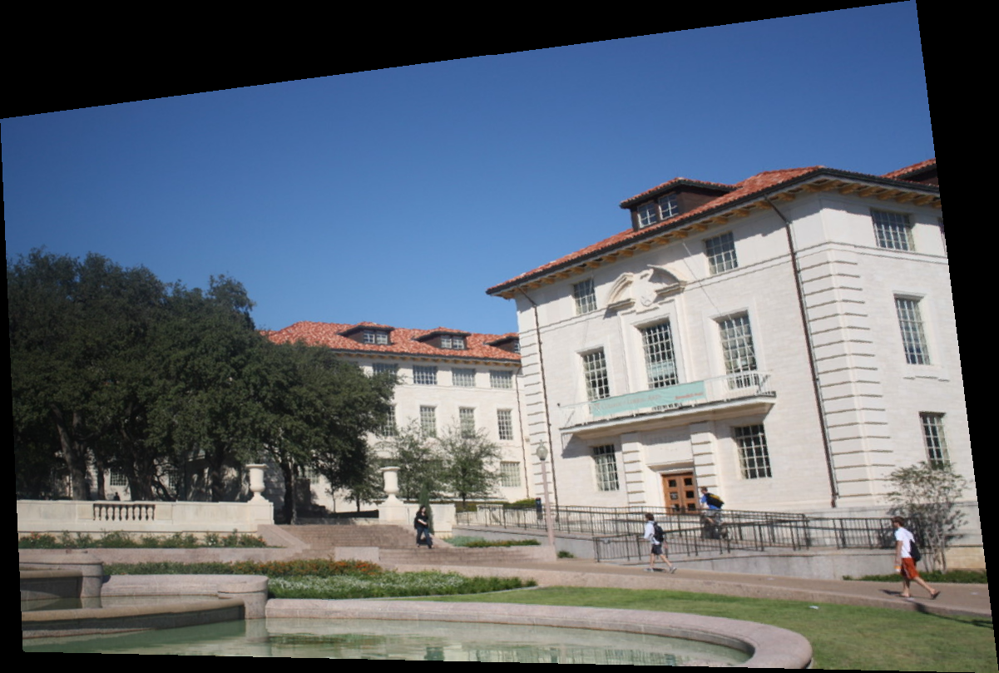

In [ ]:
shiftX, shiftY, transformedImg = warpingImage(img1,H)
cv2_imshow(transformedImg)

**Function to stitch the 2 images**

In [ ]:
def stitchImages(origImg, transformedImg, shiftX, shiftY, nChannels = 3):
  newImg = np.zeros(((origImg.shape[0] + transformedImg.shape[0]), (origImg.shape[1] + transformedImg.shape[1]), nChannels))
  newImg[0:transformedImg.shape[0],0:transformedImg.shape[1]] = transformedImg
  for row in range(origImg.shape[0]):
    for col in range(origImg.shape[1]):
      newX, newY = col + shiftX , row + shiftY
      newImg[newY][newX] = origImg[row][col]
  # delete black rows & columns
  idx = np.argwhere(np.all(newImg[..., :] == 0, axis=0))
  newImg = np.delete(newImg, idx, axis=1)
  idx = np.argwhere(np.all(newImg[..., :] == 0, axis=1))
  newImg = np.delete(newImg, idx, axis=0)
  # rotate image columns if shift was -ve 
  if shiftX < 0:
    newImg = np.roll(newImg, -1* shiftX, axis=1)
  if shiftY < 0:
    newImg = np.roll(newImg, -1* shiftY, axis=0)
  return newImg.astype(np.uint8)

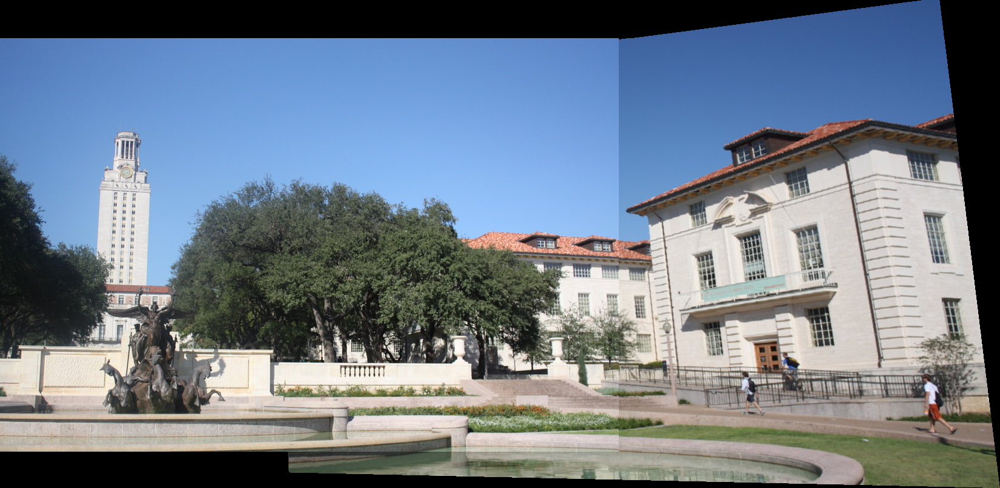

In [ ]:
outputImg = stitchImages(img2, transformedImg, shiftX, shiftY)
cv2_imshow(outputImg)

In [ ]:
def invWarpingImage(img,origImg, H):
  Hinv = np.linalg.pinv(H)
  for row in range(img.shape[0]):
    for col in range(img.shape[1]):
      acc = 0
      for channel in range(img.shape[2]):
        acc += img[row][col][channel]
      if acc == 0:
        homgCoords = np.array([(col, row, 1)]).T
        transformedCoords = Hinv.dot(homgCoords)
        transformedCoords = transformedCoords/transformedCoords[2];
        newfX, newfY = transformedCoords[0],transformedCoords[1]
        if newfX >=0 and newfX < (origImg.shape[1]-1) and newfY>=0 and newfY < (origImg.shape[0]-1):
          xLerpFrac = np.array([(1-newfX, newfX)])
          yLerpFrac = np.array([(1-newfY, newfY)]).T
          for channel in range(img.shape[2]):
            colorMatrix = np.array([(origImg[int(newfY)][int(newfX)][channel],origImg[int(newfY)+1][int(newfX)][channel])],
                                   [(origImg[int(newfY)][int(newfX)+1][channel],origImg[int(newfY)+1][int(newfX)+1][channel])])
            img[row][col][channel] = xLerpFrac.dot(colorMatrix).dot(yLerpFrac)

  return img

In [ ]:
"""
newImg = invWarpingImage(newImg,img1,H)
cv2_imshow(newImg)
"""

**Bonus Part**

**Reading the 3 images and show them**

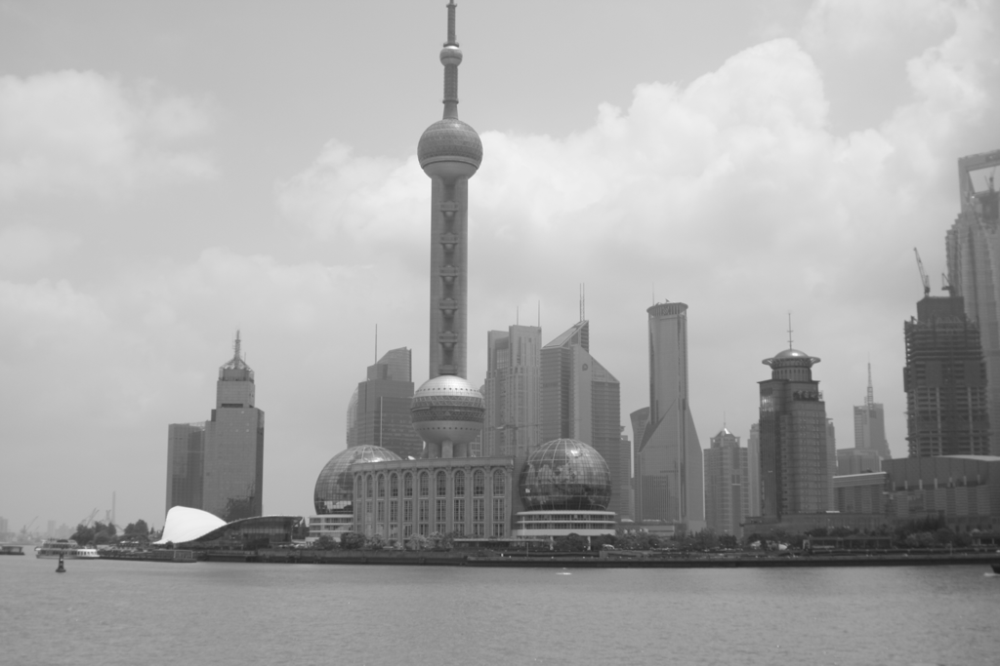

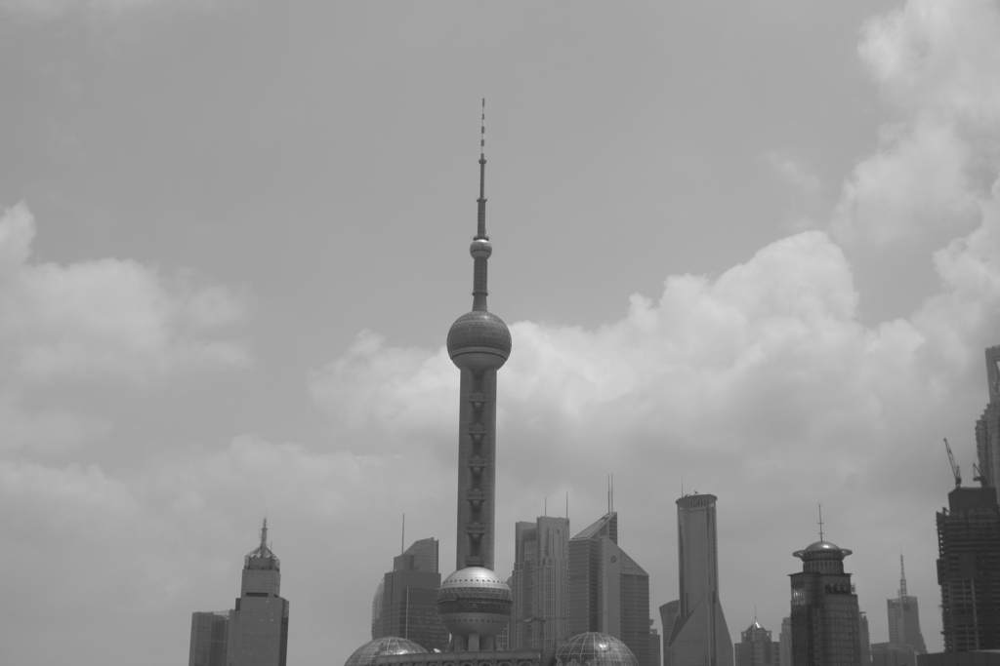

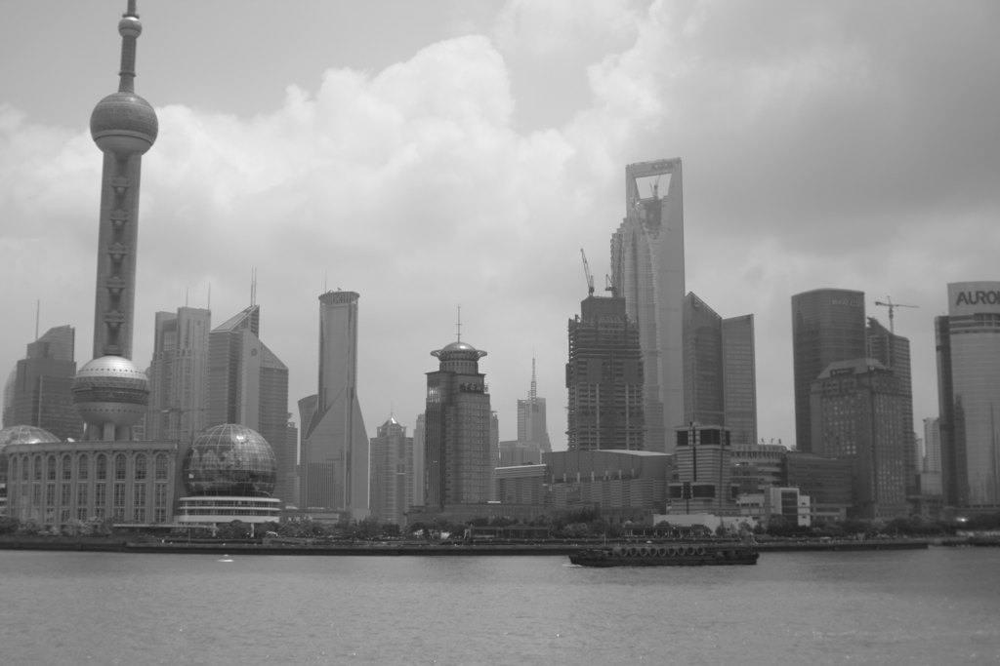

In [ ]:
shimg1 = cv2.imread('drive/MyDrive/CV_datasets/shanghai-21.png') # read image
shimg2 = cv2.imread('drive/MyDrive/CV_datasets/shanghai-22.png')
shimg3 = cv2.imread('drive/MyDrive/CV_datasets/shanghai-23.png')
cv2_imshow(shimg1)
cv2_imshow(shimg2)
cv2_imshow(shimg3)

**Function to get the matches between 2 images**

In [ ]:
def getMatches(img1,img2,maxPts=150):
  orb = cv2.ORB_create(nfeatures=3000, scoreType=cv2.ORB_FAST_SCORE)
  kp1, des1 = orb.detectAndCompute(img1, None)
  kp2, des2 = orb.detectAndCompute(img2, None)
  bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)    
  matches = bf.match(des1, des2)
  matches = sorted(matches, key = lambda x:x.distance)
  img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:150] ,np.array([]), flags=2)
  cv2_imshow(img3)
  maxMatches = min(maxPts,len(matches))
  original = np.array([kp1[matches[i].queryIdx].pt for i in range(maxMatches)])
  originalDash = np.array([kp2[matches[i].trainIdx].pt for i in range(maxMatches)])
  return original, originalDash

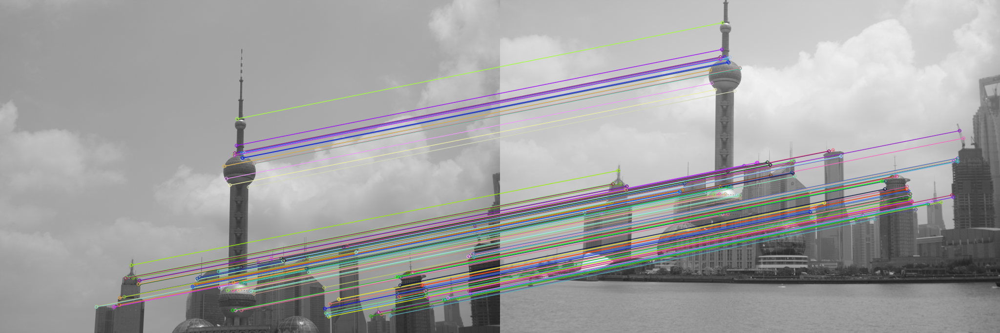

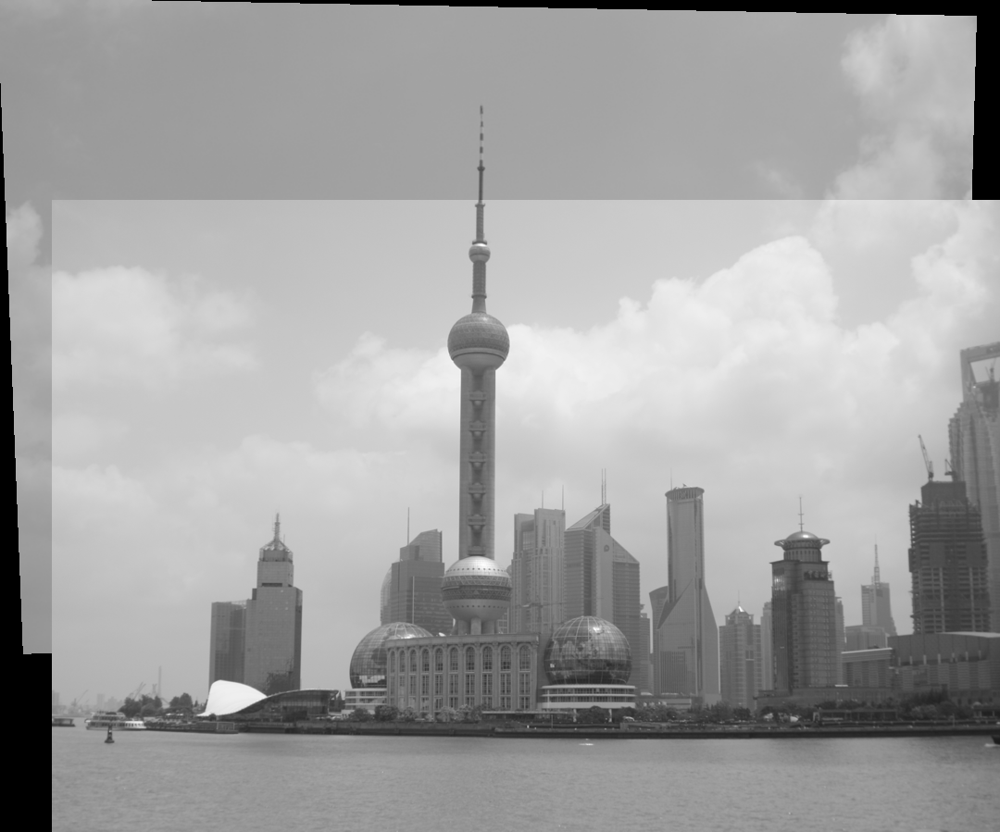

In [ ]:
original1, originalDash1 = getMatches(shimg2,shimg1)
Hbonus1 = calcHMatrix(original1, originalDash1)
#print(Hbonus1)
shiftX, shiftY, transformedImg = warpingImage(shimg2,Hbonus1)
outputImg1 = stitchImages(shimg1, transformedImg, shiftX, shiftY)
cv2_imshow(outputImg1)

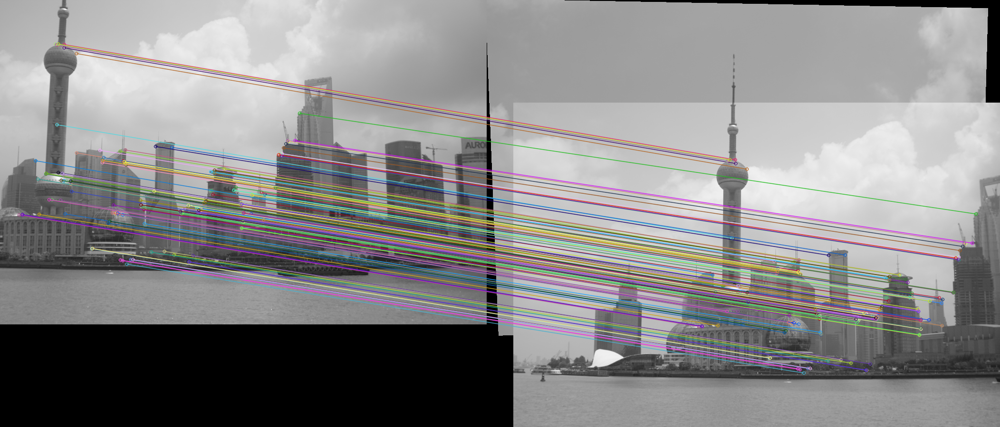

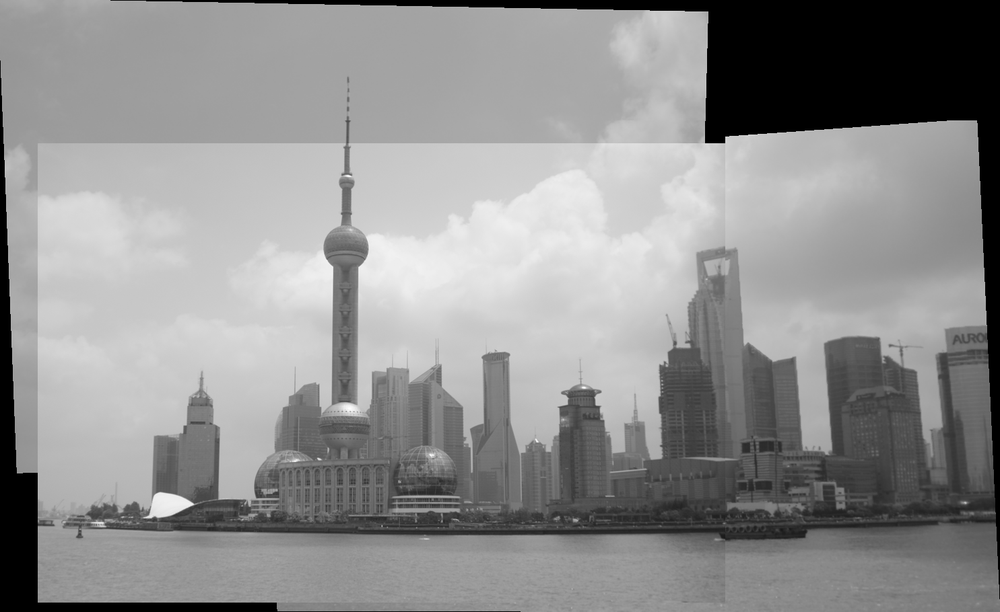

In [ ]:
original2, originalDash2 = getMatches(shimg3,outputImg1)
Hbonus2 = calcHMatrix(original2, originalDash2)
#print(Hbonus2)
shiftX, shiftY, transformedImg = warpingImage(shimg3,Hbonus2)
outputImg2 = stitchImages(outputImg1, transformedImg, shiftX, shiftY)
cv2_imshow(outputImg2)